# Import packages

In [1]:
import os

import numpy as np
import torch
import seaborn as sns

import lrf
from lrf.utils import utils

# Set output directory

In [2]:
script_dir = os.path.join(os.path.abspath(""), "experiments/examples")
save_dir = os.path.join(script_dir, "clic_flower")
prefix = "clic_flower"

# Read the image

In [3]:
image = utils.read_image("./data/clic2024/clic2024_validation_image/724b1dfdbde05257c46bb5e9863995b7c37bfcf101ed5a233ef2aa26193f09c4.png")

# Visualiza the image

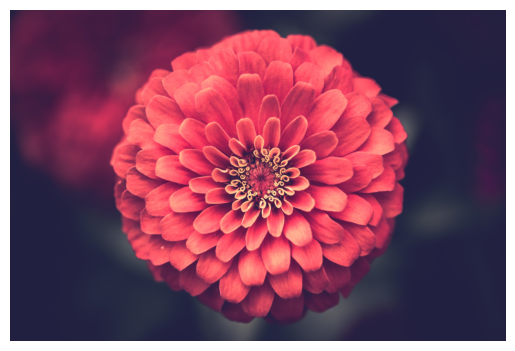

(<Figure size 640x480 with 1 Axes>, <Axes: >)

In [4]:
utils.vis_image(image, save_dir=save_dir, prefix=prefix, format="pdf")

# Calculate compression metrics

In [5]:
results = []

# JPEG
for quality in range(0, 25, 1):
    params = {"quality": quality}
    config = {"data": prefix, "method": "JPEG", **params}
    log = utils.eval_compression(
        image,
        lrf.pil_encode,
        lrf.pil_decode,
        reconstruct=True,
        format="JPEG",
        **params,
    )
    results.append({**config, **log})

# SVD
for quality in np.linspace(0.0, 4, 50):
    params = {
        "color_space": "RGB",
        "quality": quality,
        "patch": True,
        "patch_size": (8, 8),
    }
    config = {"data": prefix, "method": "SVD", **params}
    log = utils.eval_compression(
        image, lrf.svd_encode, lrf.svd_decode, reconstruct=True, **params
    )
    results.append({**config, **log})


# IMF
for quality in np.linspace(0, 25, 75):
    params = {
        "color_space": "YCbCr",
        "scale_factor": (0.5, 0.5),
        "quality": (quality, quality / 2, quality / 2),
        "patch": True,
        "patch_size": (8, 8),
        "bounds": (-16, 15),
        "dtype": torch.int8,
        "num_iters": 10,
        "verbose": False,
    }
    config = {"data": prefix, "method": "IMF", **params}
    log = utils.eval_compression(
        image, lrf.imf_encode, lrf.imf_decode, reconstruct=True, **params
    )
    results.append({**config, **log})

# Plot metrics vs bpp

/Users/pooya/opt/miniconda3/envs/deepenv/lib/python3.11/site-packages/seaborn/utils.py:470: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)
/Users/pooya/opt/miniconda3/envs/deepenv/lib/python3.11/site-packages/seaborn/utils.py:470: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  new_legend = legend_func(handles, labels, loc=loc, **props)


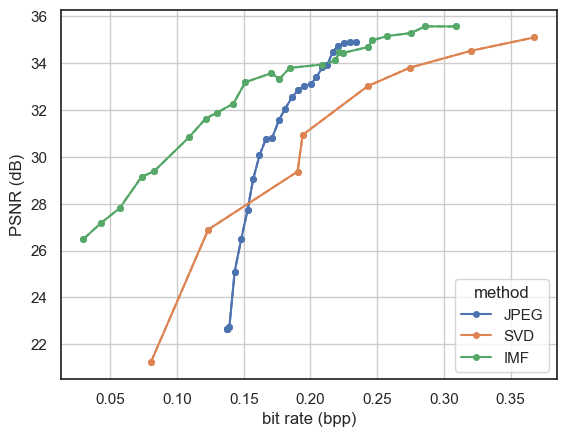

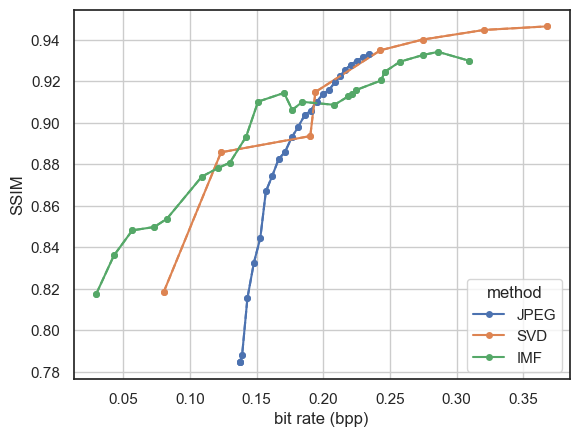

In [6]:
sns.set_theme(style="white")
plot = utils.Plot(results, columns=("data", "method", "bit rate (bpp)", "PSNR (dB)"))
plot.plot(x="bit rate (bpp)", y="PSNR (dB)", groupby="method", errorbar=None)

plot = utils.Plot(results, columns=("data", "method", "bit rate (bpp)", "SSIM"))
plot.plot(x="bit rate (bpp)", y="SSIM", groupby="method", errorbar=None)

# Make qualitative comparisons

(<Figure size 1800x10500 with 63 Axes>,
 array([[<Axes: title={'center': 'JPEG'}, xlabel='bpp = 0.14, PSNR = 22.66dB'>,
         <Axes: title={'center': 'SVD'}, xlabel='bpp = 0.08, PSNR = 21.23dB'>,
         <Axes: title={'center': 'IMF'}, xlabel='bpp = 0.11, PSNR = 30.83dB'>],
        [<Axes: xlabel='bpp = 0.14, PSNR = 22.66dB'>,
         <Axes: xlabel='bpp = 0.12, PSNR = 26.90dB'>,
         <Axes: xlabel='bpp = 0.11, PSNR = 30.83dB'>],
        [<Axes: xlabel='bpp = 0.14, PSNR = 22.66dB'>,
         <Axes: xlabel='bpp = 0.12, PSNR = 26.90dB'>,
         <Axes: xlabel='bpp = 0.12, PSNR = 31.63dB'>],
        [<Axes: xlabel='bpp = 0.14, PSNR = 22.66dB'>,
         <Axes: xlabel='bpp = 0.12, PSNR = 26.90dB'>,
         <Axes: xlabel='bpp = 0.13, PSNR = 31.88dB'>],
        [<Axes: xlabel='bpp = 0.14, PSNR = 22.72dB'>,
         <Axes: xlabel='bpp = 0.12, PSNR = 26.90dB'>,
         <Axes: xlabel='bpp = 0.14, PSNR = 32.27dB'>],
        [<Axes: xlabel='bpp = 0.15, PSNR = 26.47dB'>,
         <Axes:

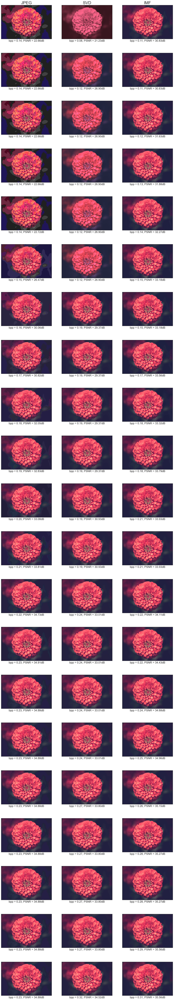

In [7]:
bpps = np.arange(.1,.31, .01)
utils.vis_collage(results, bpps=bpps, save_dir=save_dir, prefix=prefix, format="pdf")

# Save results

In [8]:
selcted_results = [
    {k: v for k, v in dc.items() if k != "reconstructed"} for dc in results
]
utils.save_config(selcted_results, save_dir=save_dir, prefix=prefix)